# SECTION 18

1. What's the machine learning?
2. What's the knn algorithm?
3. What's the regression?
4. What's the loss function and why it is the key our machine learning task.
5. Waht's the Gradient Descent?


In [48]:
from sklearn.datasets import fetch_openml
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('default')
%matplotlib inline

import random

In [49]:
dataset = fetch_openml(name='boston', version=1, as_frame=True, return_X_y=False, parser='pandas')

In [50]:
dir(dataset)

['DESCR',
 'categories',
 'data',
 'details',
 'feature_names',
 'frame',
 'target',
 'target_names',
 'url']

In [51]:
dataset['feature_names']

['CRIM',
 'ZN',
 'INDUS',
 'CHAS',
 'NOX',
 'RM',
 'AGE',
 'DIS',
 'RAD',
 'TAX',
 'PTRATIO',
 'B',
 'LSTAT']

In [52]:
print(dataset['DESCR'])

**Author**:   
**Source**: Unknown - Date unknown  
**Please cite**:   

The Boston house-price data of Harrison, D. and Rubinfeld, D.L. 'Hedonic
prices and the demand for clean air', J. Environ. Economics & Management,
vol.5, 81-102, 1978.   Used in Belsley, Kuh & Welsch, 'Regression diagnostics
...', Wiley, 1980.   N.B. Various transformations are used in the table on
pages 244-261 of the latter.
Variables in order:
CRIM     per capita crime rate by town
ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
INDUS    proportion of non-retail business acres per town
CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
NOX      nitric oxides concentration (parts per 10 million)
RM       average number of rooms per dwelling
AGE      proportion of owner-occupied units built prior to 1940
DIS      weighted distances to five Boston employment centres
RAD      index of accessibility to radial highways
TAX      full-value property-tax rate per $10

In [53]:
data = dataset['data']
target = dataset['target']
columns = dataset['feature_names']

In [54]:
dataframe = pd.DataFrame(data)
print(len(dataframe))
dataframe.head(5)

506


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33


In [55]:
dataframe['price'] = dataset['target']

In [56]:
dataframe

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,price
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273.0,21.0,393.45,6.48,22.0


In [57]:
dataframe.corr()

/var/folders/h4/7cr1cmpn7v5b3x20_9wz8m740000gn/T/ipykernel_85336/4279439629.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  dataframe.corr()


,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,TAX,PTRATIO,B,LSTAT,price
CRIM,1.000000,-0.200469,0.406583,0.420972,-0.219247,0.352734,-0.379670,0.582764,0.289946,-0.385064,0.455621,-0.388305
ZN,-0.200469,1.000000,-0.533828,-0.516604,0.311991,-0.569537,0.664408,-0.314563,-0.391679,0.175520,-0.412995,0.360445
INDUS,0.406583,-0.533828,1.000000,0.763651,-0.391676,0.644779,-0.708027,0.720760,0.383248,-0.356977,0.603800,-0.483725
NOX,0.420972,-0.516604,0.763651,1.000000,-0.302188,0.731470,-0.769230,0.668023,0.188933,-0.380051,0.590879,-0.427321
RM,-0.219247,0.311991,-0.391676,-0.302188,1.000000,-0.240265,0.205246,-0.292048,-0.355501,0.128069,-0.613808,0.695360
AGE,0.352734,-0.569537,0.644779,0.731470,-0.240265,1.000000,-0.747881,0.506456,0.261515,-0.273534,0.602339,-0.376955
DIS,-0.379670,0.664408,-0.708027,-0.769230,0.205246,-0.747881,1.000000,-0.534432,-0.232471,0.291512,-0.496996,0.249929
TAX,0.582764,-0.314563,0.720760,0.668023,-0.292048,0.506456,-0.534432,1.000000,0.460853,-0.441808,0.543993,-0.468536
PTRATIO,0.289946,-0.391679,0.383248,0.188933,-0.355501,0.261515,-0.232471,0.460853,1.000000,-0.177383,0.374044,-0.507787
B,-0.385064,0.175520,-0.356977,-0.380051,0.128069,-0.273534,0.291512,-0.441808,-0.177383,1.000000,-0.366087,0.333461


/var/folders/h4/7cr1cmpn7v5b3x20_9wz8m740000gn/T/ipykernel_85336/1463136943.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(dataframe.corr())


<Axes: >

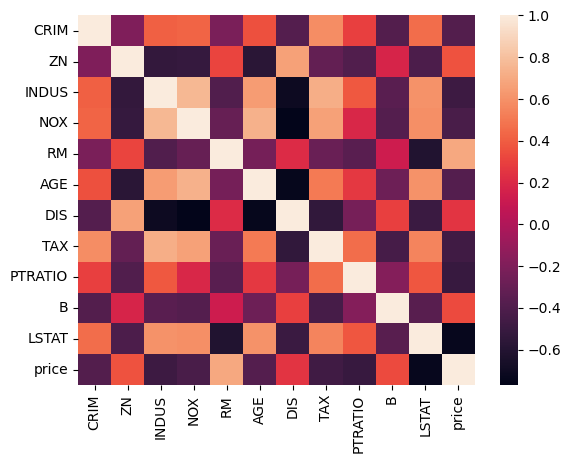

In [58]:
sns.heatmap(dataframe.corr())

In [59]:
X_rm = dataframe['RM'].values
y = dataframe['price']

In [60]:
rm_to_price = {r: y for r, y in zip(X_rm, y)}

In [61]:
rm_to_price[6.421]

21.6

In [62]:
def find_price_by_simila(history_price, query_x, topn=3):
    return np.mean([p for x, p in sorted(history_price.items(), key=lambda x_y: (x_y[0] - query_x) **2)[:topn]])



In [63]:
# readability reformulation
# def find_price_by_simila(history_price, query_x, topn=3):
#     most_similar_items = sorted(history_price.items(), key=lambda x_y: (x_y[0] - query_x) **2)[:topn]
#     most_similar_prices = [price for rm, price in most_similar_items]
#     average_prices = np.mean(most_similar_prices)
#     return average_prices

In [64]:
find_price_by_simila(rm_to_price, 7)

29.233333333333334

### Sort

In [65]:
person_and_age = {
    'A Jacky Cheung': 62,
    'C Jay Chou': 44,
    'B Mao Buyi': 29
}

np.mean([age for name, age in sorted(list(person_and_age.items()), key=lambda e: e[1], reverse=True)[:2]])

53.0

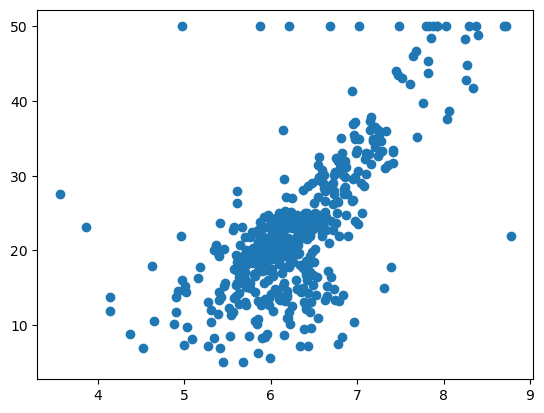

In [66]:
plt.scatter(X_rm, y)

In [67]:
real_y = [3, 6, 7]
y_hats = [3, 4, 7]
y_hats2 = [3, 6, 6]

In [68]:
def loss(y, yhat):
    return np.mean((np.array(y) - np.array(yhat))** 2)

In [69]:
loss(real_y, y_hats)

1.3333333333333333

In [70]:
loss(real_y, y_hats2)

0.3333333333333333

In [71]:
def model(x, k, b):
    return x * k +b

In [72]:
VAR_MAX, VAR_MIN = 100, -100
min_loss = float('inf')
best_k, best_b = None, None

total_times = 10**3

for t in range(total_times):
    k, b = random.randint(VAR_MIN, VAR_MAX), random.randint(VAR_MIN,VAR_MAX)

    loss_ = loss(y, model(X_rm, k, b))

    if loss_ < min_loss:
        min_loss = loss_
        best_k, best_b = k, b
        print("At {} iteration found better k: {}, b: {}, loss: {}".format(t, k, b, loss_))

At 0 iteration found better k: 75, b: -95, loss: 127368.03871417986
At 4 iteration found better k: -24, b: 94, loss: 6882.120662197628
At 6 iteration found better k: 0, b: 6, loss: 357.7532411067193
At 25 iteration found better k: -1, b: 31, loss: 98.64494752371543
At 106 iteration found better k: 6, b: -18, loss: 56.32242231620554
At 126 iteration found better k: 5, b: -9, loss: 51.90330074110672


In [73]:
def loss(y, yhat):
    return np.mean((np.array(y) - np.array(yhat)) ** 2)

def partial_k(x, y, k_n, b_n):
    return 2 * np.mean((y - (k * x + b))*(-x))

def partial_b(x, y, k_n, b_n):
    return 2 * np.mean((y - (k * x + b))*(-1))

In [74]:
k,b = random.random(), random.random()

min_loss = float('inf')
best_k, best_b = None, None

total_times = 10**5
alpha = 1e-3

k_b_history = []

for t in range(total_times):
    k = k + (-1) * partial_k(X_rm, y, k, b) * alpha 
    b = b + (-1) * partial_b(X_rm, y, k, b) * alpha

    loss_ = loss(y, model(X_rm, k, b))

    if loss_ < min_loss:
        min_loss = loss_
        best_k, best_b = k, b
        k_b_history.append([best_k, best_b])
        print("At {} iteration found better k: {}, b: {}, loss: {}".format(t, k, b, loss_))

At 0 iteration found better k: 0.3173649945814212, b: 0.13848919446462457, loss: 497.7742946740103
At 1 iteration found better k: 0.5824318931440942, b: 0.17595708571602914, loss: 428.9210632983635
At 2 iteration found better k: 0.8258281552171594, b: 0.21029072814817634, loss: 370.87073988986737
At 3 iteration found better k: 1.0493263642501247, b: 0.24174649423545902, loss: 321.92833941988175
At 4 iteration found better k: 1.254554112448079, b: 0.2705597860634399, loss: 280.66482272339357
At 5 iteration found better k: 1.44300586055802, b: 0.2969467506347082, loss: 245.87536905808975
At 6 iteration found better k: 1.6160538275653513, b: 0.3211058548686028, loss: 216.54419579178548
At 7 iteration found better k: 1.7749579896505685, b: 0.3432193317713615, loss: 191.81489795846554
At 8 iteration found better k: 1.920875261265595, b: 0.3634545083145139, loss: 170.96544160270983
At 9 iteration found better k: 2.054867925229574, b: 0.38196502469737825, loss: 153.38708072233325
At 10 iterat

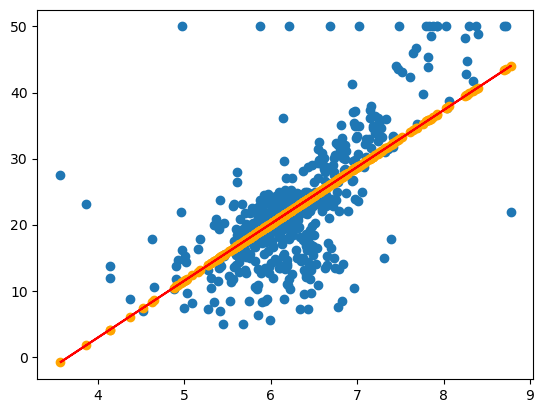

In [75]:
plt.scatter(X_rm, y)
plt.scatter(X_rm, best_k * X_rm + best_b, color='orange')
plt.plot(X_rm, best_k * X_rm + best_b, color='red')

In [76]:
test_0, test_1, test_2, test_3, test_4 = 0, 10, 50, 5000, -1

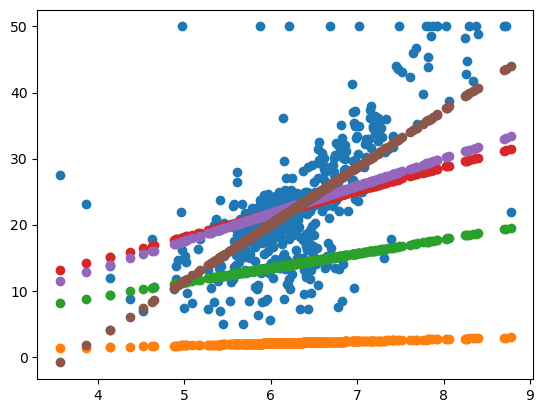

In [77]:
plt.scatter(X_rm, y)
plt.scatter(X_rm, k_b_history[test_0][0] * X_rm + k_b_history[test_0][1])
plt.scatter(X_rm, k_b_history[test_1][0] * X_rm + k_b_history[test_1][1])
plt.scatter(X_rm, k_b_history[test_2][0] * X_rm + k_b_history[test_2][1])
plt.scatter(X_rm, k_b_history[test_3][0] * X_rm + k_b_history[test_3][1])
plt.scatter(X_rm, k_b_history[test_4][0] * X_rm + k_b_history[test_4][1])

In [78]:
%time
model(7, best_k, best_b)

CPU times: user 1e+03 ns, sys: 0 ns, total: 1e+03 ns
Wall time: 1.91 µs


28.725714349522974

In [79]:
%time
find_price_by_simila(rm_to_price, 7)

CPU times: user 2 µs, sys: 0 ns, total: 2 µs
Wall time: 5.96 µs


29.233333333333334